In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()

In [2]:
july_df = pd.read_csv('E:/Project 5 credits/Final Project/july2021.csv',  sep='\t')

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\IPython\core\interactiveshell.py:3166: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
july_df.head()

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1287175800165240832,1287175710793072641,2020-07-26 05:29:59 Sri Lanka Standard Time,2020-07-26,05:29:59,530,1272646475797889024,jennikimvcr,Vivi⁷ ♡︎’s AJ,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
1,1287175800119164928,1287175800119164928,2020-07-26 05:29:59 Sri Lanka Standard Time,2020-07-26,05:29:59,530,96285088,srubabati,Srubabati Goswami,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
2,1287175800102543362,1287174788499288065,2020-07-26 05:29:59 Sri Lanka Standard Time,2020-07-26,05:29:59,530,2296030249,noobtheloser,AC Stuart 🆒️,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'hobbitfancier', 'name': 'Pam...",NaN,NaN,NaN,NaN
3,1287175800052232193,1287146966611304449,2020-07-26 05:29:59 Sri Lanka Standard Time,2020-07-26,05:29:59,530,1277259997110579201,pupst0rm,Pup Storm,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'PupSudo', 'name': 'Pup Sudo ...",NaN,NaN,NaN,NaN
4,1287175799938805760,1287175799938805760,2020-07-26 05:29:59 Sri Lanka Standard Time,2020-07-26,05:29:59,530,231450238,cientro,Didyouseemybag_JK⁷,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN


In [4]:
july_df.info(null_counts=True)

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114900 entries, 0 to 114899
Data columns (total 36 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               114900 non-null  int64  
 1   conversation_id  114900 non-null  int64  
 2   created_at       114900 non-null  object 
 3   date             114900 non-null  object 
 4   time             114900 non-null  object 
 5   timezone         114900 non-null  int64  
 6   user_id          114900 non-null  int64  
 7   username         114900 non-null  object 
 8   name             114889 non-null  object 
 9   place            239 non-null     object 
 10  tweet            114900 non-null  object 
 11  language         114900 non-null  object 
 12  mentions         114900 non-null  object 
 13  urls             114900 non-null  object 
 14  photos           114900 non-null  object 
 15  replies_count    114900 non-null  int64  
 16  retweets_count   114900 non-null  int6

In [5]:
july_df.dtypes

id                   int64
conversation_id      int64
created_at          object
date                object
time                object
timezone             int64
user_id              int64
username            object
name                object
place               object
tweet               object
language            object
mentions            object
urls                object
photos              object
replies_count        int64
retweets_count       int64
likes_count          int64
hashtags            object
cashtags            object
link                object
retweet               bool
quote_url           object
video                int64
thumbnail           object
near               float64
geo                float64
source             float64
user_rt_id         float64
user_rt            float64
retweet_id         float64
reply_to            object
retweet_date       float64
translate          float64
trans_src          float64
trans_dest         float64
dtype: object

<AxesSubplot:>

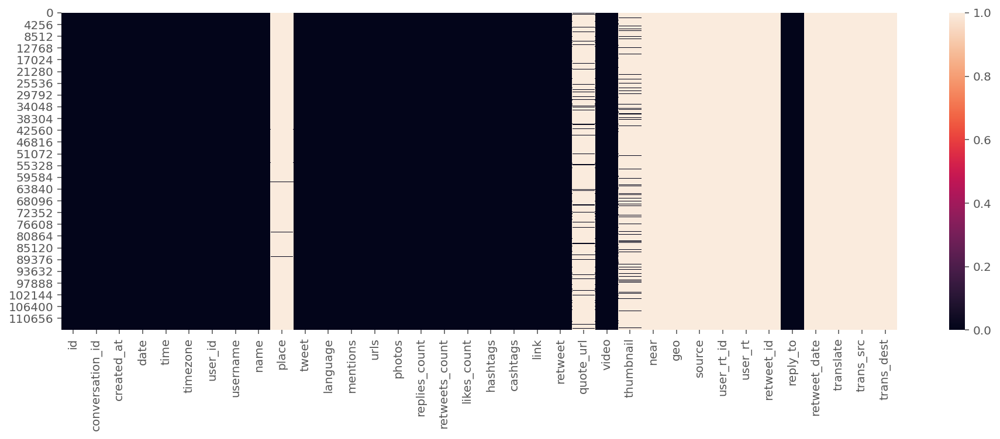

In [6]:
# check for null value in data
plt.figure(figsize = (16,5))
sns.heatmap(july_df.isnull())

In [7]:
import plotly.express as px

missed = pd.DataFrame()
missed['column'] = july_df.columns

missed['percent'] = [round(100* july_df[col].isnull().sum() / len(july_df), 2) for col in july_df.columns]
missed = missed.sort_values('percent')
missed = missed[missed['percent']>0]

fig = px.bar(
    missed, 
    x='percent', 
    y="column", 
    orientation='h', 
    title='Missed values percent for every column (percent > 0)', 
    height=400, 
    width=600
)

fig.show()

In [8]:
july_df.corr()

,id,conversation_id,timezone,user_id,replies_count,retweets_count,likes_count,retweet,video,near,geo,source,user_rt_id,user_rt,retweet_id,retweet_date,translate,trans_src,trans_dest
id,1.000000,-0.000443,NaN,-0.005130,0.001568,-0.002287,-0.001167,NaN,-0.011372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
conversation_id,-0.000443,1.000000,NaN,-0.005483,0.000020,0.000887,0.001153,NaN,0.006800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
timezone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
user_id,-0.005130,-0.005483,NaN,1.000000,-0.005038,-0.007061,-0.008894,NaN,0.017063,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
replies_count,0.001568,0.000020,NaN,-0.005038,1.000000,0.346323,0.485340,NaN,0.023884,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweets_count,-0.002287,0.000887,NaN,-0.007061,0.346323,1.000000,0.727440,NaN,0.023611,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
likes_count,-0.001167,0.001153,NaN,-0.008894,0.485340,0.727440,1.000000,NaN,0.029282,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
video,-0.011372,0.006800,NaN,0.017063,0.023884,0.023611,0.029282,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
near,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Text(0.5, 1.0, 'Correlation Heatmap')

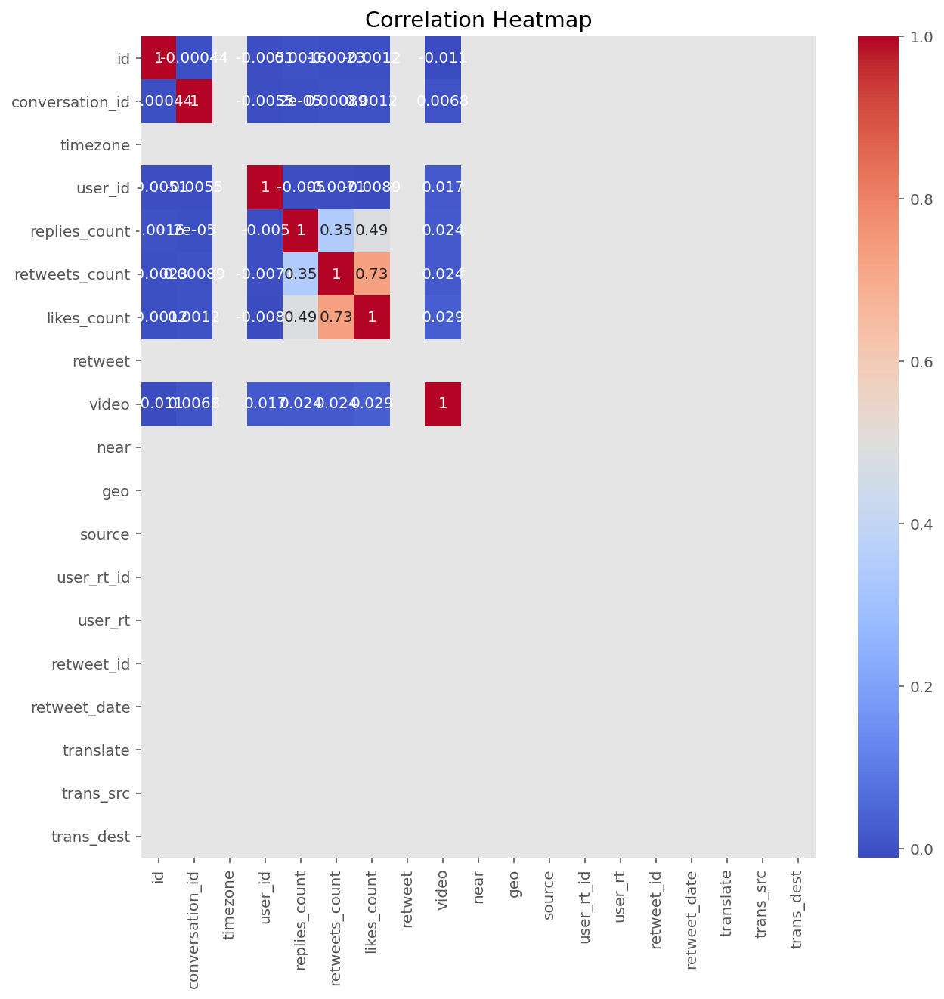

In [9]:
plt.figure(figsize=(10,10))
sns.heatmap(july_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap')

In [10]:
df_new = july_df['username'].value_counts().reset_index()
df_new.columns = ['username', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="username", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [11]:
df_new.tail(10)

,username,tweets_count
9,georgewherbert,23
8,chan_to_the_ho,24
7,the_eniolanimi,26
6,julia_with_luv,26
5,sportsthread,29
4,simplesalsa_,31
3,yyoo11122,45
2,politica_econom,47
1,theoslavalamp,51
0,kaporcenter,61


In [12]:
july_df= pd.merge(july_df, df_new, on='username')

In [13]:
july_df.drop(['hashtags','cashtags','thumbnail','source','user_rt','retweet_id','reply_to','retweet_date','translate','trans_src','trans_dest', 'timezone', 'name', 'created_at', 'user_id', 'place', 'likes_count', 'link', 'retweet', 'quote_url', 'video', 'user_rt_id', 'near', 'geo', 'mentions', 'urls', 'photos', 'replies_count', 'retweets_count','conversation_id'], axis = 1, inplace = True)
july_df.drop_duplicates()
july_df.head()

,id,date,time,username,tweet,language,tweets_count
0,1287175800165240832,2020-07-26,05:29:59,jennikimvcr,@Midnight_Brock 😍😍 the facial hair,en,1
1,1287175800119164928,2020-07-26,05:29:59,srubabati,UP MBBS Students on College Opening: ‘Why Are ...,en,1
2,1287175800102543362,2020-07-26,05:29:59,noobtheloser,@hobbitfancier i thought it was when u order a...,en,1
3,1287175800052232193,2020-07-26,05:29:59,pupst0rm,@PupSudo @wruffstuff I appreciate that they cr...,en,1
4,1287175799938805760,2020-07-26,05:29:59,cientro,I was driving yesterday looking at the same sk...,en,1


In [14]:
july_df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114900 entries, 0 to 114899
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            114900 non-null  int64 
 1   date          114900 non-null  object
 2   time          114900 non-null  object
 3   username      114900 non-null  object
 4   tweet         114900 non-null  object
 5   language      114900 non-null  object
 6   tweets_count  114900 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 7.0+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [15]:
july_df.dtypes

id               int64
date            object
time            object
username        object
tweet           object
language        object
tweets_count     int64
dtype: object

<AxesSubplot:>

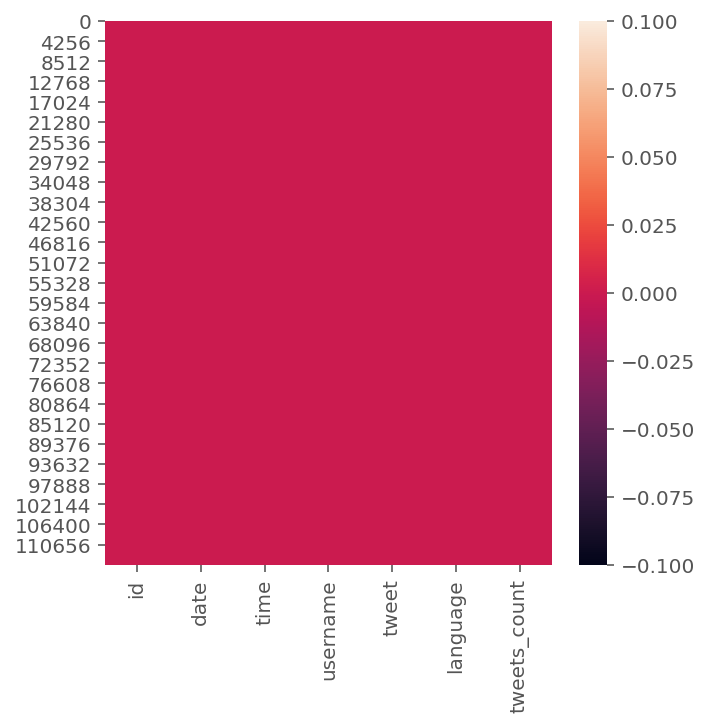

In [16]:
# check for null value in data
plt.figure(figsize = (5,5))
sns.heatmap(july_df.isnull())

Text(0.5, 1.0, 'Correlation Heatmap After Dropping Null Val')

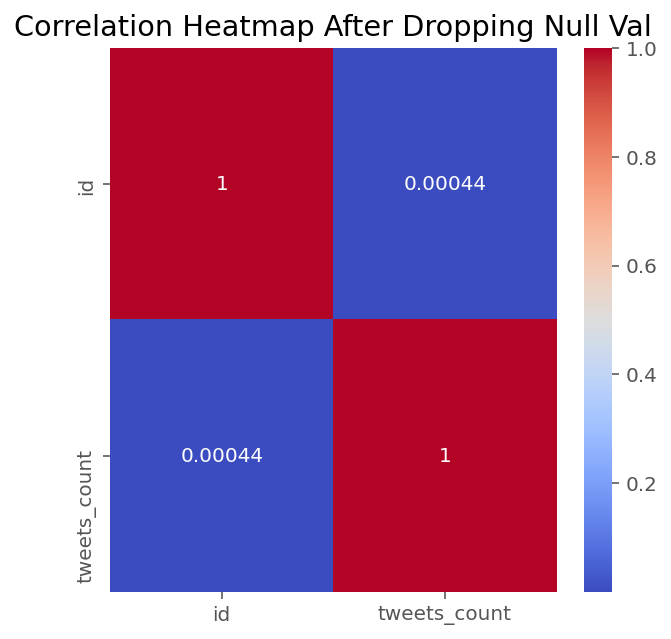

In [17]:
plt.figure(figsize=(5,5))
sns.heatmap(july_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap After Dropping Null Val')

In [18]:
df_english_only = july_df[july_df['language'] == 'en']
df_english_only.head()

,id,date,time,username,tweet,language,tweets_count
0,1287175800165240832,2020-07-26,05:29:59,jennikimvcr,@Midnight_Brock 😍😍 the facial hair,en,1
1,1287175800119164928,2020-07-26,05:29:59,srubabati,UP MBBS Students on College Opening: ‘Why Are ...,en,1
2,1287175800102543362,2020-07-26,05:29:59,noobtheloser,@hobbitfancier i thought it was when u order a...,en,1
3,1287175800052232193,2020-07-26,05:29:59,pupst0rm,@PupSudo @wruffstuff I appreciate that they cr...,en,1
4,1287175799938805760,2020-07-26,05:29:59,cientro,I was driving yesterday looking at the same sk...,en,1


In [19]:
df_english_only.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 111317 entries, 0 to 114899
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            111317 non-null  int64 
 1   date          111317 non-null  object
 2   time          111317 non-null  object
 3   username      111317 non-null  object
 4   tweet         111317 non-null  object
 5   language      111317 non-null  object
 6   tweets_count  111317 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 6.8+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [20]:
july_df = pd.concat([df_english_only], ignore_index=True)

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [22]:
df_new = july_df[july_df['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                         id        date      time      username  \
0       1287175800165240832  2020-07-26  05:29:59   jennikimvcr   
1       1287175800119164928  2020-07-26  05:29:59     srubabati   
2       1287175800102543362  2020-07-26  05:29:59  noobtheloser   
3       1287175800052232193  2020-07-26  05:29:59      pupst0rm   
4       1287175799938805760  2020-07-26  05:29:59       cientro   
...                     ...         ...       ...           ...   
111312  1287171901085962247  2020-07-26  05:14:30   morseyevs93   
111313  1287171901081649153  2020-07-26  05:14:30      dascenzo   
111314  1287171901073297411  2020-07-26  05:14:30  obvlously_28   
111315  1287171901060653056  2020-07-26  05:14:30   samguarrera   
111316  1287171901023031297  2020-07-26  05:14:30  snick_wit_it   

                                                    tweet language  \
0                      @Midnight_Brock 😍😍 the facial hair       en   
1       UP MBBS Students on College Opening: ‘Why Are .

In [23]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [24]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1287175800165240832,2020-07-26,05:29:59,jennikimvcr,@Midnight_Brock 😍😍 the facial hair,en,1,midnight_brock facial hair,Neutral
1,1287175800119164928,2020-07-26,05:29:59,srubabati,UP MBBS Students on College Opening: ‘Why Are ...,en,1,up mbbs students college opening why are colle...,Neutral
2,1287175800102543362,2020-07-26,05:29:59,noobtheloser,@hobbitfancier i thought it was when u order a...,en,1,hobbitfancier thought u order gun gotta wait d...,Negative
3,1287175800052232193,2020-07-26,05:29:59,pupst0rm,@PupSudo @wruffstuff I appreciate that they cr...,en,1,pupsudo wruffstuff i appreciate credited artis...,Positive
4,1287175799938805760,2020-07-26,05:29:59,cientro,I was driving yesterday looking at the same sk...,en,1,i driving yesterday looking sky kim namjoon th...,Positive


(-0.5, 399.5, 199.5, -0.5)

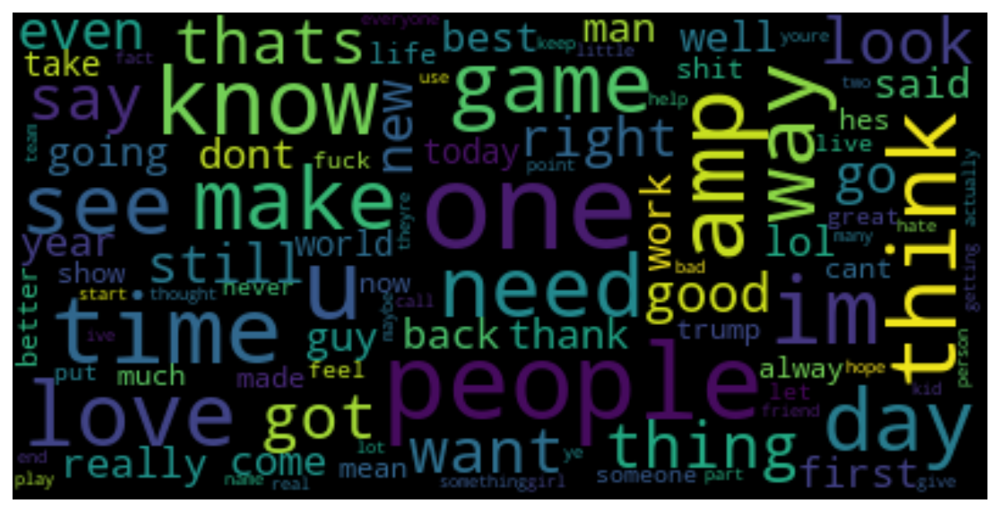

In [25]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [26]:
df_new['text']

0                                midnight_brock facial hair
1         up mbbs students college opening why are colle...
2         hobbitfancier thought u order gun gotta wait d...
3         pupsudo wruffstuff i appreciate credited artis...
4         i driving yesterday looking sky kim namjoon th...
                                ...                        
111312    last gig lockdown supergrass ally pally sun hi...
111313    why didnt nba put strip club bubble fucking id...
111314    affinitweet halloween duo i even dress year sc...
111315    domjet weststigers no way though id like see u...
111316    belikemikewhite delvinhgcjordan she barely ste...
Name: text, Length: 111317, dtype: object

In [27]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,52291
0,Negative,31812
1,Neutral,27214


<AxesSubplot:xlabel='sentiment', ylabel='count'>

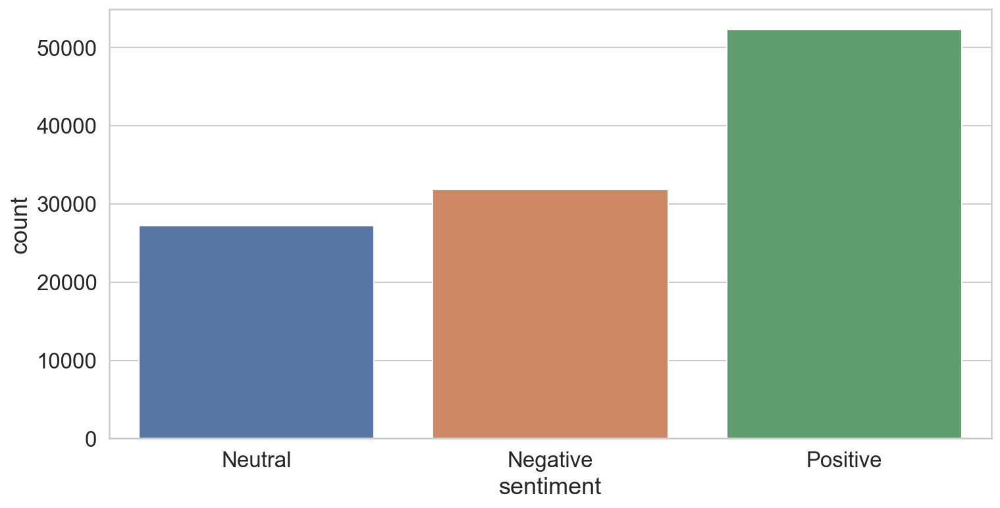

In [28]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [29]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

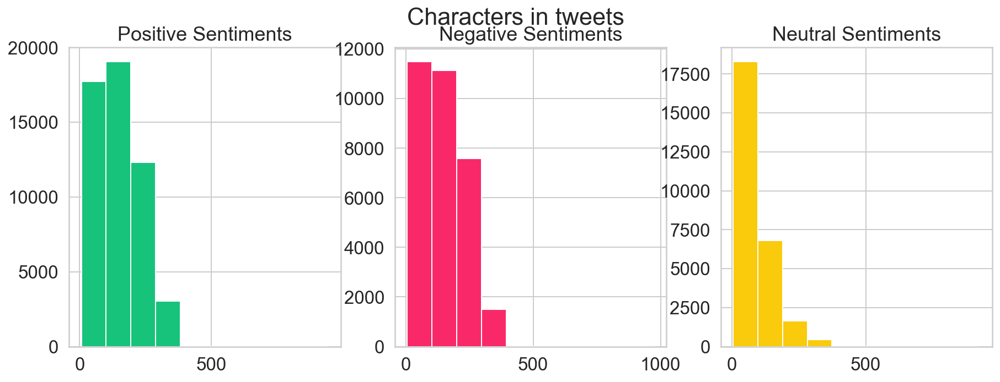

In [30]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

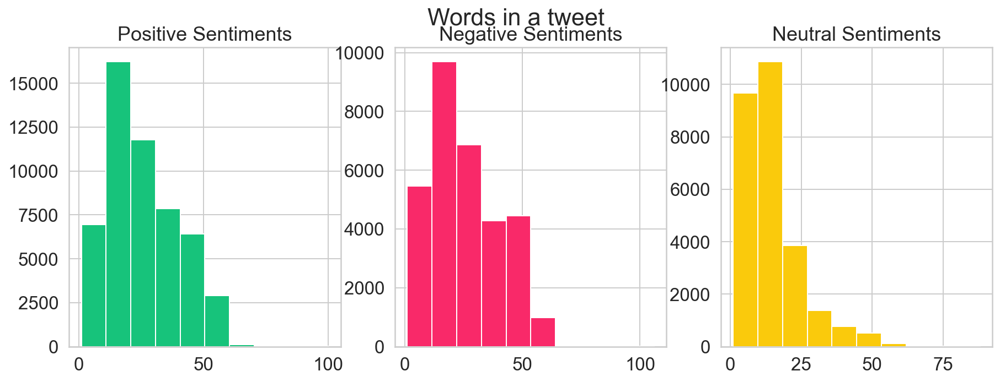

In [31]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

Text(0.5, 0.98, 'Average word length in each tweet')

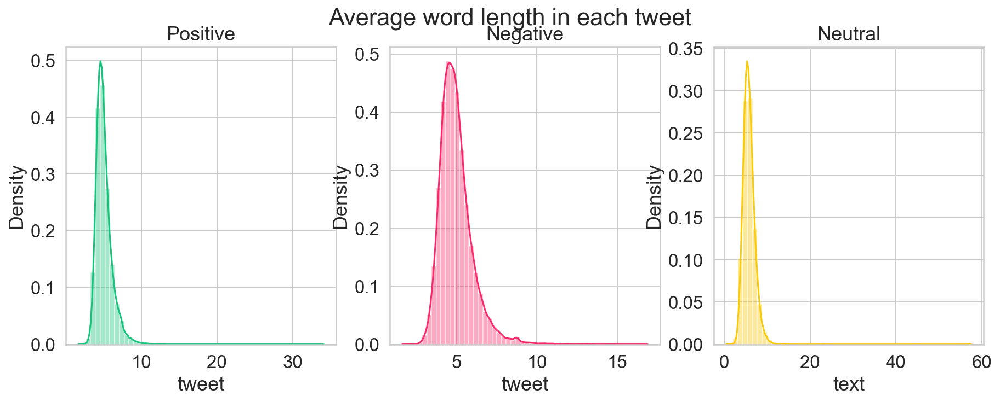

In [32]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [33]:
def create_corpus(target):
    corpus=[]
    
    for x in df_new[df_new['sentiment']==target ]['text'].str.split():
        for i in x:
            corpus.append(i)
    return corpus

In [34]:
np.array(stopwords)

array({'s', 'your', 'isn', 'while', "didn't", 'on', 'why', 'does', 'will', 'doing', 'under', "shouldn't", 'not', "it's", 'all', 'mightn', 'that', 'because', 'if', 'same', 'o', 'yourselves', 'theirs', 'hadn', 'once', 'a', "you'll", 'off', 'so', 'shan', 'this', 'more', 'him', 'were', 'an', 'you', 'has', "should've", 'herself', 'other', 'below', 'at', 've', 'their', 'ain', 'are', 'with', 'aren', 'wouldn', 'can', 'as', 'hasn', 'few', 't', 'each', 'itself', 'have', 'against', 'how', 'there', 'out', "mustn't", 'just', 'don', 'mustn', 'me', 'here', "weren't", 'be', 'myself', 'he', 'it', "wouldn't", 'do', "needn't", 'in', 'between', 'after', "isn't", 'yourself', 'd', 'through', 'ourselves', "she's", 'into', "couldn't", 'then', "that'll", 'ma', 'both', 'didn', 'until', 'very', 'most', 'some', 'needn', 'm', "hasn't", 'hers', "mightn't", 'been', 'but', 'where', 'to', 'am', 'she', 'those', 'for', 'only', 'own', 'himself', 'y', 'and', 'by', 'any', 'his', "hadn't", 'is', 'ours', "aren't", 'which', "

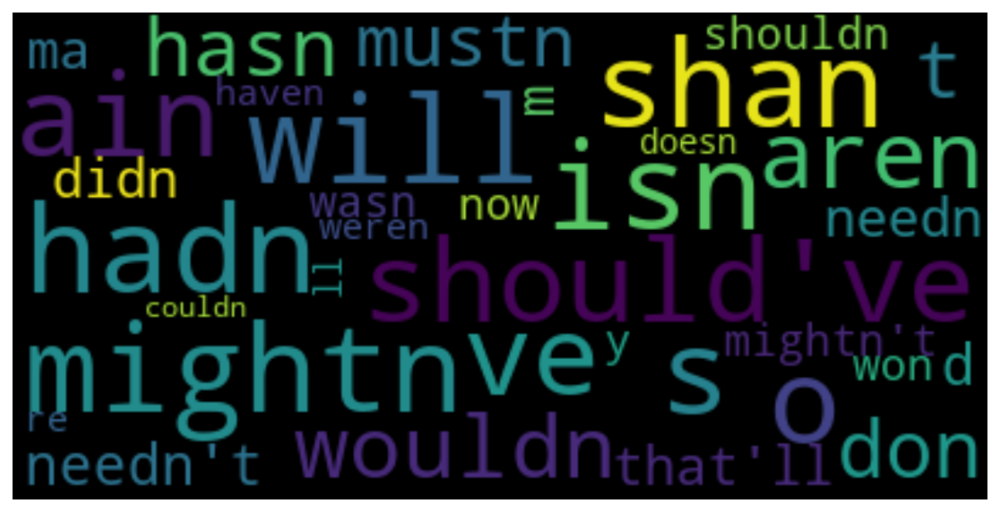

In [35]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show()

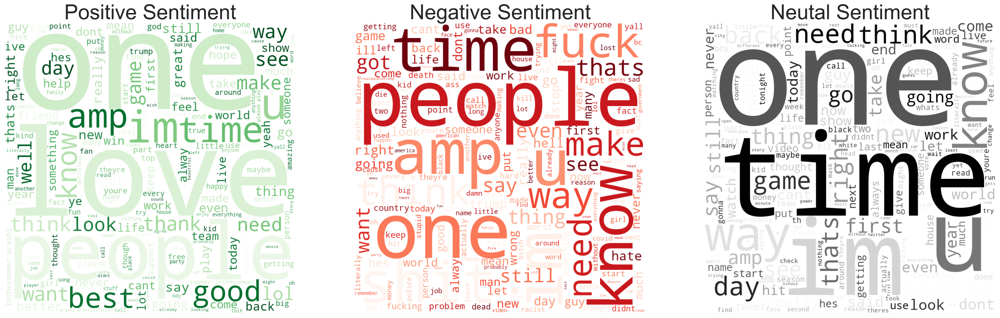

In [36]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [37]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

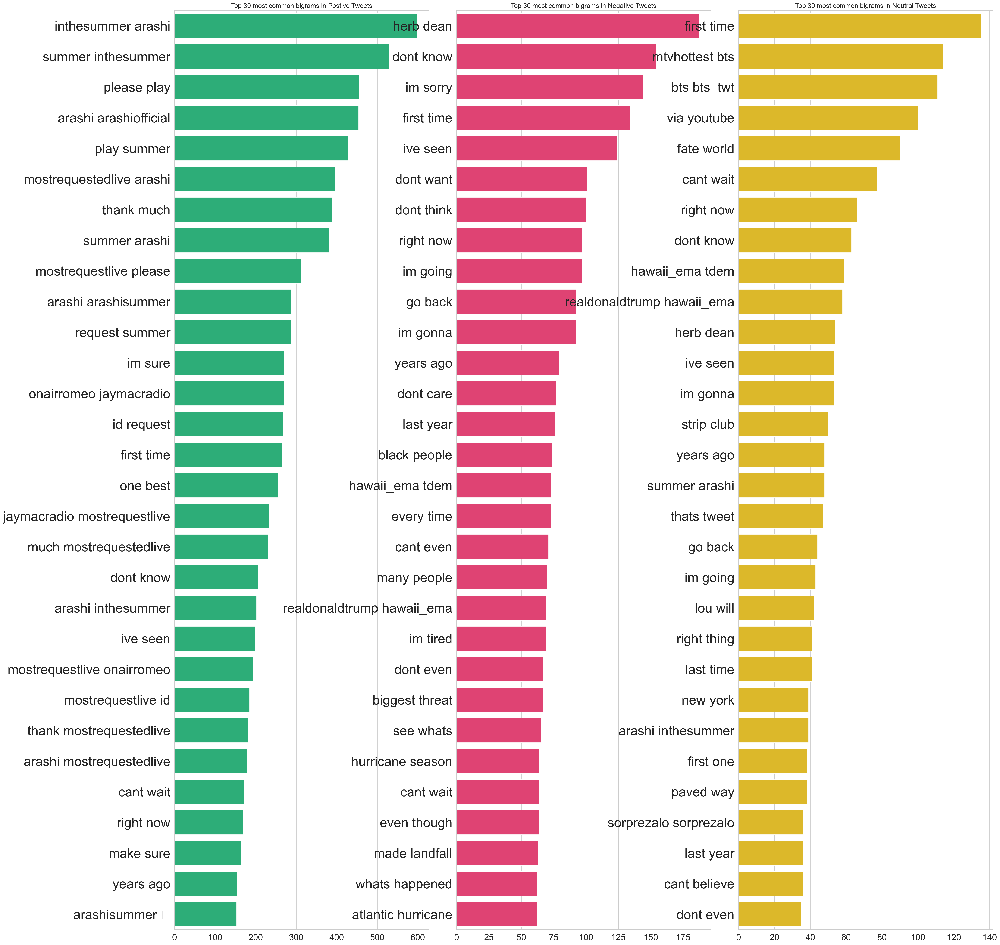

In [38]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

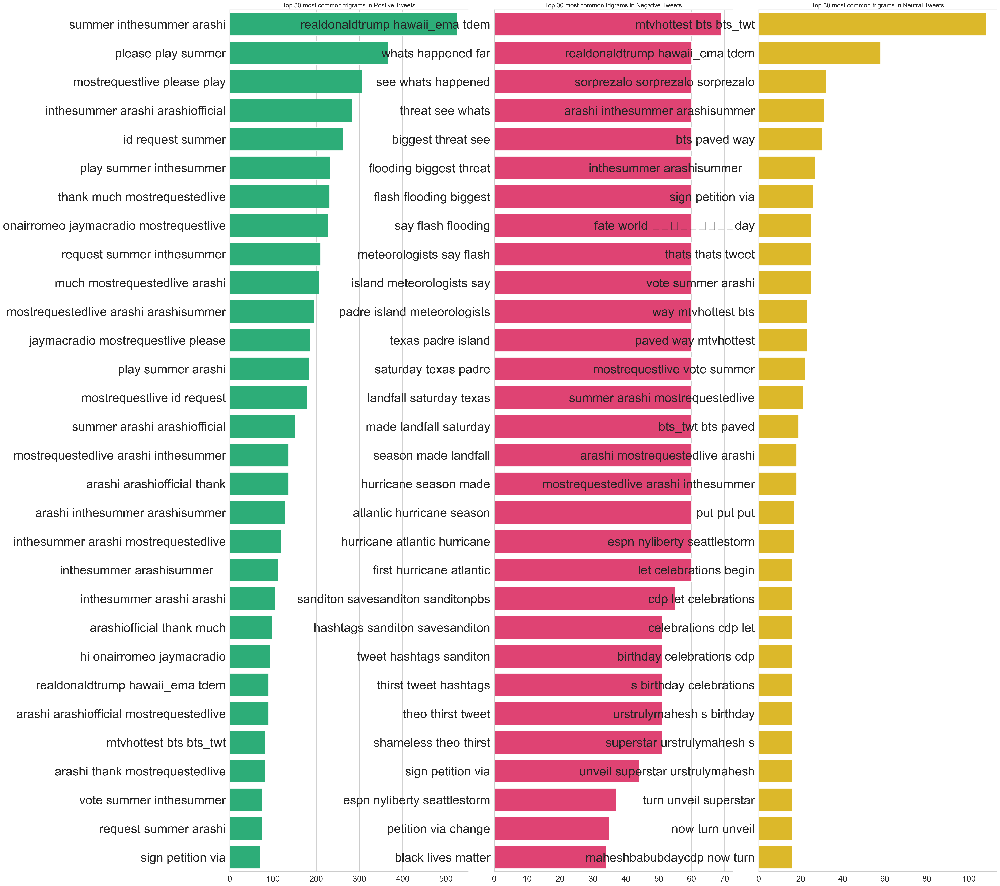

In [39]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [40]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1287175800165240832,2020-07-26,05:29:59,jennikimvcr,@Midnight_Brock 😍😍 the facial hair,en,1,midnight_brock facial hair,Neutral
1,1287175800119164928,2020-07-26,05:29:59,srubabati,UP MBBS Students on College Opening: ‘Why Are ...,en,1,up mbbs students college opening why are colle...,Neutral
2,1287175800102543362,2020-07-26,05:29:59,noobtheloser,@hobbitfancier i thought it was when u order a...,en,1,hobbitfancier thought u order gun gotta wait d...,Negative
3,1287175800052232193,2020-07-26,05:29:59,pupst0rm,@PupSudo @wruffstuff I appreciate that they cr...,en,1,pupsudo wruffstuff i appreciate credited artis...,Positive
4,1287175799938805760,2020-07-26,05:29:59,cientro,I was driving yesterday looking at the same sk...,en,1,i driving yesterday looking sky kim namjoon th...,Positive


In [41]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)

In [42]:
df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1287174619208679424,2020-07-26,05:25:18,orchid_shark,@lilymrosenthal the only good thing to come ou...,en,1,lilymrosenthal good thing come bachelor times ...,Positive
1,1287172395275493377,2020-07-26,05:16:28,ninahachigian,“Even before collapsing further due to Trump’s...,en,3,even collapsing due trumps mishandling pandemi...,Positive
2,1287174702268649473,2020-07-26,05:25:38,flangguk,@jkjmkkyu @BTS_twt BTS PAVED THE WAY :) #MTVH...,en,1,jkjmkkyu bts_twt bts paved the way mtvhottest ...,Neutral
3,1287171916478980098,2020-07-26,05:14:34,salmonslayer72,@tmj4 @realDonaldTrump @BrettFavre I see Brent...,en,2,tmj realdonaldtrump brettfavre i see brent wen...,Neutral
4,1287173492778176516,2020-07-26,05:20:49,vx_gas_attack,@BearsFanJordan @alexanderraisc1 @joerogan Alc...,en,1,bearsfanjordan alexanderraisc joerogan alcubie...,Neutral


In [43]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,51697
0,Negative,31562
1,Neutral,27042


<AxesSubplot:xlabel='sentiment', ylabel='count'>

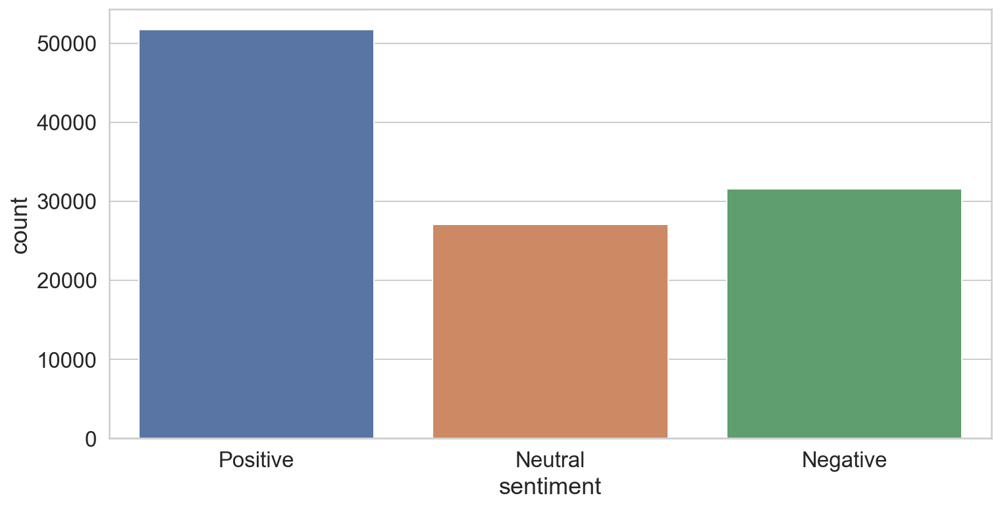

In [44]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [45]:
print(df_new)

                         id        date      time        username  \
0       1287174619208679424  2020-07-26  05:25:18    orchid_shark   
1       1287172395275493377  2020-07-26  05:16:28   ninahachigian   
2       1287174702268649473  2020-07-26  05:25:38        flangguk   
3       1287171916478980098  2020-07-26  05:14:34  salmonslayer72   
4       1287173492778176516  2020-07-26  05:20:49   vx_gas_attack   
...                     ...         ...       ...             ...   
110296  1287173964872265729  2020-07-26  05:22:42    danielnodolf   
110297  1287171948074676224  2020-07-26  05:14:41     nia_ghtmare   
110298  1287175640337330177  2020-07-26  05:29:21      elizawally   
110299  1287173269745889281  2020-07-26  05:19:56        mikajuab   
110300  1287175334379560960  2020-07-26  05:28:08   cocksrecruits   

                                                    tweet language  \
0       @lilymrosenthal the only good thing to come ou...       en   
1       “Even before collapsing

In [46]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [47]:
len(df_new_final)

40000

In [48]:
export_csv = df_new_final.to_csv(r'july2021 tweets.csv')